# Exploratory Data Analysis

First we shall do a more detailed EDA case studies on 2 chosen stock Apple and Goldman Sachs Banking group.

In [4]:
import requests
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels as stat
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
# !pip install pmdarima
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error

import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

import math



In [5]:
stock_path = "data_yahoo/train/Stocks/APPL"
indices_path = "data_yahoo/train/indices"  # folder with 3 indices

from stock_processing import preprocess_stock

AAPL = preprocess_stock("data_yahoo/train/Stocks/AAPL.csv")
GS = preprocess_stock("data_yahoo/train/Stocks/GS.csv")



In [6]:
stocks = [AAPL, GS]


# Compute 20-day moving average. 20 days is around the number of days in a trading month.
for ticker in stocks:
    window = 20
    ticker['Adj_Close'] = ticker['Adjusted']
   
    
    ticker['MA20_close'] = ticker['Adj_Close'].rolling(window=window).mean()
    
    ticker['STD20_close'] = ticker['Adj_Close'].rolling(window).std()
    ticker['Lower_close'] = ticker['MA20_close'] - (2 * ticker['STD20_close'])
    ticker['Upper_close'] = ticker['MA20_close'] + (2 * ticker['STD20_close'])
    ticker['BollPct_close'] = (ticker['Adj_Close'] - ticker['MA20_close']) / (2 * ticker['Adj_Close'].rolling(window).std())
    ticker['Vol20_close']   = ticker['Adj_Close'].rolling(window).std()
    
    
    ticker['EMA20_close'] = ticker['Adj_Close'].ewm(span=window, adjust=False).mean()

    # Lags of stock and indices
    ticker['Lag1_close'] = ticker['Adj_Close'].shift(1)
    ticker['Lag2_close'] = ticker['Adj_Close'].shift(2)
    ticker['Lag5_close'] = ticker['Adj_Close'].shift(5)

    # Momentum = rolling sum of returns
    ticker['Mom5_close']  = ticker['Adj_Close'].rolling(5,  min_periods=5).sum()
    ticker['Mom10_close'] = ticker['Adj_Close'].rolling(10, min_periods=10).sum()

    # RSI (relative strength index, 14-day)
    gains  = ticker['Adj_Close'].diff().clip(lower=0)
    losses = -ticker['Adj_Close'].diff().clip(upper=0)

    avg_gain = gains.rolling(14, min_periods=14).mean()
    avg_loss = losses.rolling(14, min_periods=14).mean()

    rs = avg_gain / avg_loss.replace(0, np.nan)
    ticker['RSI14_close'] = 100 - (100 / (1 + rs))
    
    # print(ticker.head(50))
    print(ticker.info())
    print(ticker.head())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2514 entries, 2015-01-05 to 2024-12-30
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Ticker          2514 non-null   object 
 1   Open            2514 non-null   float64
 2   High            2514 non-null   float64
 3   Low             2514 non-null   float64
 4   Close           2514 non-null   float64
 5   Adjusted        2514 non-null   float64
 6   Volume          2514 non-null   int64  
 7   Log_Adj_Return  2514 non-null   float64
 8   Adj_Close       2514 non-null   float64
 9   MA20_close      2495 non-null   float64
 10  STD20_close     2495 non-null   float64
 11  Lower_close     2495 non-null   float64
 12  Upper_close     2495 non-null   float64
 13  BollPct_close   2495 non-null   float64
 14  Vol20_close     2495 non-null   float64
 15  EMA20_close     2514 non-null   float64
 16  Lag1_close      2513 non-null   float64
 17  Lag2_close     

In [7]:
# Compute 20-day moving average. 20 days is around the number of days in a trading month.
for ticker in stocks:
    window = 20
   
    ticker['Adj_Return'] = ticker['Adjusted'].pct_change()
    
    ticker['MA20'] = ticker['Adj_Return'].rolling(window=window).mean()
    
    ticker['STD20'] = ticker['Adj_Return'].rolling(window).std()
    ticker['Lower'] = ticker['MA20'] - (2 * ticker['STD20'])
    ticker['Upper'] = ticker['MA20'] + (2 * ticker['STD20'])
    ticker['BollPct'] = (ticker['Adj_Return'] - ticker['MA20']) / (2 * ticker['Adj_Return'].rolling(window).std())
    ticker['Vol20']   = ticker['Adj_Return'].rolling(window).std()
    
    
    ticker['EMA20'] = ticker['Adj_Return'].ewm(span=window, adjust=False).mean()

    # Lags of stock and indices
    ticker['Lag1'] = ticker['Adj_Return'].shift(1)
    ticker['Lag2'] = ticker['Adj_Return'].shift(2)
    ticker['Lag5'] = ticker['Adj_Return'].shift(5)

    # Momentum = rolling sum of returns
    ticker['Mom5']  = ticker['Adj_Return'].rolling(5,  min_periods=5).sum()
    ticker['Mom10'] = ticker['Adj_Return'].rolling(10, min_periods=10).sum()

    # RSI (relative strength index, 14-day)
    gains  = ticker['Adj_Return'].diff().clip(lower=0)
    losses = -ticker['Adj_Return'].diff().clip(upper=0)

    avg_gain = gains.rolling(14, min_periods=14).mean()
    avg_loss = losses.rolling(14, min_periods=14).mean()

    rs = avg_gain / avg_loss.replace(0, np.nan)
    ticker['RSI14'] = 100 - (100 / (1 + rs))
    
    # print(ticker.head(50))
    print(ticker.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2514 entries, 2015-01-05 to 2024-12-30
Data columns (total 36 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Ticker          2514 non-null   object 
 1   Open            2514 non-null   float64
 2   High            2514 non-null   float64
 3   Low             2514 non-null   float64
 4   Close           2514 non-null   float64
 5   Adjusted        2514 non-null   float64
 6   Volume          2514 non-null   int64  
 7   Log_Adj_Return  2514 non-null   float64
 8   Adj_Close       2514 non-null   float64
 9   MA20_close      2495 non-null   float64
 10  STD20_close     2495 non-null   float64
 11  Lower_close     2495 non-null   float64
 12  Upper_close     2495 non-null   float64
 13  BollPct_close   2495 non-null   float64
 14  Vol20_close     2495 non-null   float64
 15  EMA20_close     2514 non-null   float64
 16  Lag1_close      2513 non-null   float64
 17  Lag2_close     

In [8]:
# # Create figure with 2 rows (subplots), UNCOMMENT TO USE
# fig = make_subplots(rows=2, cols=1, 
#                     shared_xaxes=True,  # Share x-axis between subplots
#                     vertical_spacing=0.1,  # Add some space between the panels
#                     subplot_titles=("Adjusted Close Price + SMA with Bollinger Bands", "Adjusted Close + EMA"))

# # Add traces for top panel (Adjusted Close + SMA)
# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index, 
#         y=AAPL['Adj_Close'],
#         mode='lines',
#         name='Apple Adjusted Close',
#         line=dict(color='blue')
#     ),
#     row=1, col=1  # Place in first row
# )

# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index, 
#         y=AAPL['MA20_close'],
#         mode='lines',
#         name='20-day Moving Average',
#         line=dict(color='yellow')
#     ),
#     row=1, col=1  # Place in first row
# )

# # Upper band
# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index,
#         y=AAPL['Upper_close'],
#         mode='lines',
#         name='Upper Band',
#         line=dict(color='green', dash='dash')
#     ),
#     row=1, col=1
# )

# # Lower band
# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index,
#         y=AAPL['Lower_close'],
#         mode='lines',
#         name='Lower Band',
#         line=dict(color='red', dash='dash'),
#         fill='tonexty',   # Fills between lower and upper
#         fillcolor='rgba(128,128,128,0.1)'  # light grey shade
#     ),
#     row=1, col=1
# )

# # Add traces for bottom panel (Adjusted Close + EMA)
# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index, 
#         y=AAPL['Adj_Close'],
#         mode='lines',
#         name='Apple Adjusted Close',
#         line=dict(color='blue'),
#         showlegend=False  # Hide from legend since it's already shown in top panel
#     ),
#     row=2, col=1  # Place in second row
# )

# fig.add_trace(
#     go.Scatter(
#         x=AAPL.index, 
#         y=AAPL['EMA20_close'],
#         mode='lines',
#         name='20-day Exponential Moving Average',
#         line=dict(color='orange')
#     ),
#     row=2, col=1  # Place in second row
# )

# # Update layout
# fig.update_layout(
#     title="Apple Close Price Analysis",
#     xaxis_title="Date",
#     height=1500,  # Taller figure to accommodate two panels
#     width=1700,
#     hovermode="x unified"
# )

# # Update y-axis labels
# fig.update_yaxes(title_text="Price (USD) per Share", row=1, col=1)
# fig.update_yaxes(title_text="Price (USD) per Share", row=2, col=1)


# fig.show()



In [9]:
# fig.update_yaxes(title_text="Price (USD) per Share", row=1, col=1)
# fig.update_yaxes(title_text="Price (USD) per Share", row=2, col=1)
 # xaxis_title="Date",

In [10]:
AAPL['Adj_Close'].describe()   

count    2514.000000
mean       93.915754
std        65.442479
min        20.624048
25%        35.304071
50%        64.450443
75%       150.365856
max       258.103729
Name: Adj_Close, dtype: float64

## Adjusted Returns  

In [12]:
# Create figure with 2 rows (subplots)
fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True,  # Share x-axis between subplots
                    vertical_spacing=0.1,  # Add some space between the panels
                    subplot_titles=("Adjusted Returns + SMA with Bollinger Bands", "Adjusted Returns + EMA"))

# Add traces for top panel (Adjusted Close + SMA)
fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['Adj_Return'],
        mode='lines',
        name='Apple Adjusted Return',
        line=dict(color='blue')
    ),
    row=1, col=1  # Place in first row
)

fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['MA20'],
        mode='lines',
        name='20-day Moving Average',
        line=dict(color='yellow')
    ),
    row=1, col=1  # Place in first row
)

# Upper band
fig.add_trace(
    go.Scatter(
        x=AAPL.index,
        y=AAPL['Upper'],
        mode='lines',
        name='Upper Band',
        line=dict(color='green', dash='dash')
    ),
    row=1, col=1
)

# Lower band
fig.add_trace(
    go.Scatter(
        x=AAPL.index,
        y=AAPL['Lower'],
        mode='lines',
        name='Lower Band',
        line=dict(color='red', dash='dash'),
        fill='tonexty',   # Fills between lower and upper
        fillcolor='rgba(128,128,128,0.1)'  # light grey shade
    ),
    row=1, col=1
)

# Add traces for bottom panel (Adjusted Close + EMA)
fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['Adj_Return'],
        mode='lines',
        name='Apple Adjusted Return',
        line=dict(color='blue'),
        showlegend=False  # Hide from legend since it's already shown in top panel
    ),
    row=2, col=1  # Place in second row
)

fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['EMA20'],
        mode='lines',
        name='20-day Exponential Moving Average',
        line=dict(color='orange')
    ),
    row=2, col=1  # Place in second row
)

# Update layout with larger fonts
fig.update_layout(
    title=dict(
        text="Apple Adjusted Returns 2015-2024",
        font=dict(size=28, family="Arial", color="black"),
        x=0.5, xanchor="center"
    ),
    legend=dict(
        font=dict(size=25),
        orientation="h",
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5
    ),
    height=1500,
    width=1700,
    hovermode="x unified"
)

# Update subplot titles font size
for i in fig['layout']['annotations']:
    i['font'] = dict(size=22, family="Arial", color="black")

# Update axis labels and tick sizes for ALL subplots
fig.update_xaxes(
    title_text="Date",
    title_font=dict(size=30),
    tickfont=dict(size=25)
)

fig.update_yaxes(
    title_text="Price (USD) per Share",
    title_font=dict(size=30),
    tickfont=dict(size=25)
)



fig.update_traces(visible=True)

fig.show()

In [13]:
AAPL['Adj_Return'].describe()

count    2513.000000
mean        0.001103
std         0.017926
min        -0.128647
25%        -0.007322
50%         0.001001
75%         0.010145
max         0.119808
Name: Adj_Return, dtype: float64

In [14]:
# Same for GS
# Create figure with 2 rows (subplots)
fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True,  # Share x-axis between subplots
                    vertical_spacing=0.1,  # Add some space between the panels
                    subplot_titles=("Adjusted Close + SMA with Bollinger Bands", "Adjusted Close + EMA"))

# Add traces for top panel (Adjusted Close + SMA)
fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['Adjusted'],
        mode='lines',
        name='Goldman Sachs Adjusted Close',
        line=dict(color='blue')
    ),
    row=1, col=1  # Place in first row
)

fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['MA20'],
        mode='lines',
        name='20-day Moving Average',
        line=dict(color='yellow')
    ),
    row=1, col=1  # Place in first row
)

# Upper band
fig.add_trace(
    go.Scatter(
        x=GS.index,
        y=GS['Upper'],
        mode='lines',
        name='Upper Band',
        line=dict(color='green', dash='dash')
    ),
    row=1, col=1
)

# Lower band
fig.add_trace(
    go.Scatter(
        x=GS.index,
        y=GS['Lower'],
        mode='lines',
        name='Lower Band',
        line=dict(color='red', dash='dash'),
        fill='tonexty',   # Fills between lower and upper
        fillcolor='rgba(128,128,128,0.1)'  # light grey shade
    ),
    row=1, col=1
)

# Add traces for bottom panel (Adjusted Close + EMA)
fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['Adjusted'],
        mode='lines',
        name='Goldman Sachs Adjusted Close',
        line=dict(color='blue'),
        showlegend=False  # Hide from legend since it's already shown in top panel
    ),
    row=2, col=1  # Place in second row
)

fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['EMA20'],
        mode='lines',
        name='20-day Exponential Moving Average',
        line=dict(color='orange')
    ),
    row=2, col=1  # Place in second row
)

# Update layout
fig.update_layout(
    title="Goldman Sachs Stock Price Analysis",
    xaxis_title="Date",
    height=700,  # Taller figure to accommodate two panels
    width=900,
    hovermode="x unified"
)

# Update y-axis labels
fig.update_yaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Price (USD)", row=2, col=1)

# fig.update_traces(visible=True)

fig.show()

In [15]:
# Create figure with 2 rows (subplots)
fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True,  # Share x-axis between subplots
                    vertical_spacing=0.1,  # Add some space between the panels
                    subplot_titles=("Adjusted Return", "Log Adjusted Return with 20-day Rolling Volatility"))

# Add traces for top panel (Adjusted Close + SMA)
fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['Adj_Return'],
        mode='lines',
        name='Apple Adjusted Return',
        line=dict(color='blue')
    ),
    row=1, col=1  # Place in first row
)

# Add traces for bottom panel (Adjusted Close + EMA)
fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['Log_Adj_Return'],
        mode='lines',
        name='Apple Log Adjusted Return',
        line=dict(color='blue'),
        showlegend=False  # Hide from legend since it's already shown in top panel
    ),
    row=2, col=1  # Place in second row
)

fig.add_trace(
    go.Scatter(
        x=AAPL.index, 
        y=AAPL['Vol20'],
        mode='lines',
        name='20-day Rolling Volatility',
        line=dict(color='orange')
    ),
    row=2, col=1  # Place in second row
)

# Update layout
fig.update_layout(
    title="Apple Stock Return Analysis",
    xaxis_title="Date",
    height=700,  # Taller figure to accommodate two panels
    width=900,
    hovermode="x unified"
)

# Update y-axis labels
fig.update_yaxes(title_text="Adjusted Return", row=1, col=1)
fig.update_yaxes(title_text="Log Adjusted Return", row=2, col=1)

fig.update_traces(visible=True)

fig.show()

In [16]:
# Create figure with 2 rows (subplots)
fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True,  # Share x-axis between subplots
                    vertical_spacing=0.1,  # Add some space between the panels
                    subplot_titles=("Adjusted Return", "Log Adjusted Return with 20-day Rolling Volatility"))

# Add traces for top panel (Adjusted Close + SMA)
fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['Adj_Return'],
        mode='lines',
        name='Goldman Sachs Adjusted Return',
        line=dict(color='blue')
    ),
    row=1, col=1  # Place in first row
)

# Add traces for bottom panel (Adjusted Close + EMA)
fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['Log_Adj_Return'],
        mode='lines',
        name='GS Log Adjusted Return',
        line=dict(color='blue'),
        showlegend=False  # Hide from legend since it's already shown in top panel
    ),
    row=2, col=1  # Place in second row
)

fig.add_trace(
    go.Scatter(
        x=GS.index, 
        y=GS['Vol20'],
        mode='lines',
        name='20-day Rolling Volatility',
        line=dict(color='orange')
    ),
    row=2, col=1  # Place in second row
)

# Update layout
fig.update_layout(
    title="Goldman Sachs Stock Return Analysis",
    xaxis_title="Date",
    height=700,  # Taller figure to accommodate two panels
    width=900,
    hovermode="x unified"
)

# Update y-axis labels
fig.update_yaxes(title_text="Adjusted Return", row=1, col=1)
fig.update_yaxes(title_text="Log Adjusted Return", row=2, col=1)

fig.update_traces(visible=True)

fig.show()

In [17]:
from scipy.stats import gaussian_kde, norm

stocks = {"AAPL": AAPL, "GS": GS}  # dict of ticker: dataframe
for ticker, df in stocks.items():
    # --- Prepare data ---
    x_simple = df['Adj_Return'].dropna().values
    x_log    = df['Log_Adj_Return'].dropna().values
    
    # Grids for smooth KDE lines (restrict to central 1%–99% to avoid extreme tails dominating)
    grid_simple_min, grid_simple_max = np.quantile(x_simple, [0.01, 0.99])
    grid_log_min,    grid_log_max    = np.quantile(x_log,    [0.01, 0.99])
    
    grid_simple = np.linspace(grid_simple_min, grid_simple_max, 400)
    grid_log    = np.linspace(grid_log_min,    grid_log_max,    400)
    
    # KDE estimates
    kde_simple = gaussian_kde(x_simple)
    kde_log    = gaussian_kde(x_log)
    
    # Normal distributions with same mean & std
    mu_simple, sigma_simple = x_simple.mean(), x_simple.std()
    mu_log, sigma_log       = x_log.mean(), x_log.std()
    
    normal_simple = norm.pdf(grid_simple, mu_simple, sigma_simple)
    normal_log    = norm.pdf(grid_log, mu_log, sigma_log)
    
    
    # --- Create figure with 2 subplots ---
    fig2 = make_subplots(
        rows=2, cols=1, 
        shared_xaxes=False,  
        vertical_spacing=0.2,  
        subplot_titles=("Simple Adjusted Return (daily %)", "Log Adjusted Return (daily)")
    )
    
    # ---- Top panel: Simple returns histogram ----
    fig2.add_trace(
        go.Histogram(
            x=x_simple,
            name="Simple Return",
            nbinsx=60,
            histnorm="probability density",   # normalize so KDE is comparable
            marker=dict(line=dict(width=0)),
            hovertemplate="Simple Return: %{x:.4%}<extra></extra>"
        ),
        row=1, col=1
    )
    
    # Overlay KDE line
    fig2.add_trace(
        go.Scatter(
            x=grid_simple, y=kde_simple(grid_simple),
            mode="lines", line=dict(color="black", width=2),
            name="KDE (Simple)"
        ),
        row=1, col=1
    )
    
    # Mean line (simple returns)
    fig2.add_vline(
        x=float(x_simple.mean()),
        line_dash="dash", line_color="red", row=1, col=1,
        annotation_text=f"Mean = {x_simple.mean():.4%}", 
        annotation_position="top right"
    )
    
    # Normal curve (simple)
    fig2.add_trace(go.Scatter(
        x=grid_simple, y=normal_simple,
        mode="lines", name=f"Normal(μ={mu_simple:.4f}, σ={sigma_simple:.4f})",
        line=dict(color="orange", dash="dash")
    ), row=1, col=1)
    
    
    # ---- Bottom panel: Log returns histogram ----
    fig2.add_trace(
        go.Histogram(
            x=x_log,
            name="Log Return",
            nbinsx=40,
            histnorm="probability density",   # normalize for KDE overlay
            marker=dict(line=dict(width=0)),
            hovertemplate="Log Return: %{x:.4f}<extra></extra>"
        ),
        row=2, col=1
    )
    
    # Overlay KDE line
    fig2.add_trace(
        go.Scatter(
            x=grid_log, y=kde_log(grid_log),
            mode="lines", line=dict(color="black", width=2),
            name="KDE (Log)"
        ),
        row=2, col=1
    )
    
    # Mean line (log returns)
    fig2.add_vline(
        x=float(x_log.mean()),
        line_dash="dash", line_color="red", row=2, col=1,
        annotation_text=f"Mean = {x_log.mean():.4f}", 
        annotation_position="top right"
    )
    
    # Normal curve (log)
    fig2.add_trace(go.Scatter(
        x=grid_log, y=normal_log,
        mode="lines", name=f"Normal(μ={mu_log:.4f}, σ={sigma_log:.4f})",
        line=dict(color="orange", dash="dash")
    ), row=2, col=1)
    
    
    # Update axes
    fig2.update_xaxes(title_text="Simple Adjusted Return", row=1, col=1)
    fig2.update_yaxes(title_text="Density", row=1, col=1)
    
    fig2.update_xaxes(title_text="Log Adjusted Return", row=2, col=1)
    fig2.update_yaxes(title_text="Density", row=2, col=1)
    
    # Layout
    fig2.update_layout(
        title=f"{ticker} Returns Distribution — Empirical vs Normal for Adjusted and Log Adjusted Daily Returns",
        bargap=0.02,
        height=900,
        width=1100,
        showlegend=True,
        hovermode="x unified",
    )
    fig2.update_traces(visible=True)
    fig2.show()
    
    from numpy import trapz
    
    # Evaluate KDE on a grid
    grid = np.linspace(np.quantile(x_simple, 0.001), np.quantile(x_simple, 0.999), 1000)
    pdf_vals = kde_simple(grid)
    
    # Approximate integral using trapezoidal rule
    area = trapz(pdf_vals, grid)
    print("Area under KDE curve:", area)

Area under KDE curve: 0.9976022612329354


Area under KDE curve: 0.9976098287330288


In [18]:
from scipy.stats import skew, kurtosis

for name, df in stocks.items():
    data = df["Log_Adj_Return"].dropna()
    print(f"{name}: Skew={skew(data):.3f}, Kurtosis={kurtosis(data):.3f}")

AAPL: Skew=-0.201, Kurtosis=5.444
GS: Skew=-0.096, Kurtosis=9.507


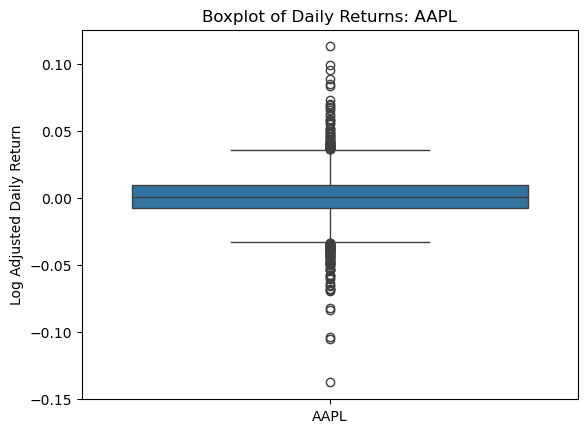

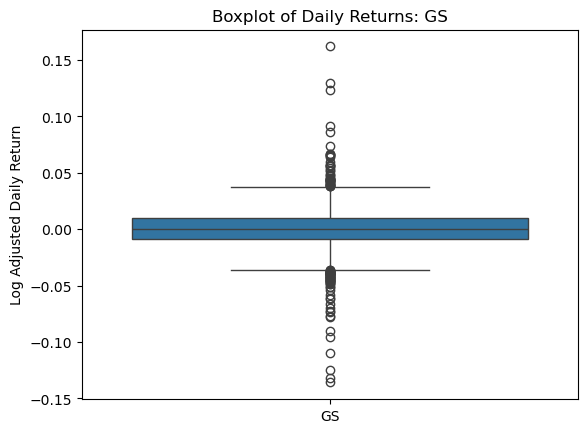

In [19]:
for name, df in stocks.items():
    sns.boxplot(data=df["Log_Adj_Return"].dropna(), orient="v")
    plt.xticks([0], [name])   # One tick, one label
    plt.ylabel("Log Adjusted Daily Return")
    plt.title(f"Boxplot of Daily Returns: {name}")
    plt.show()

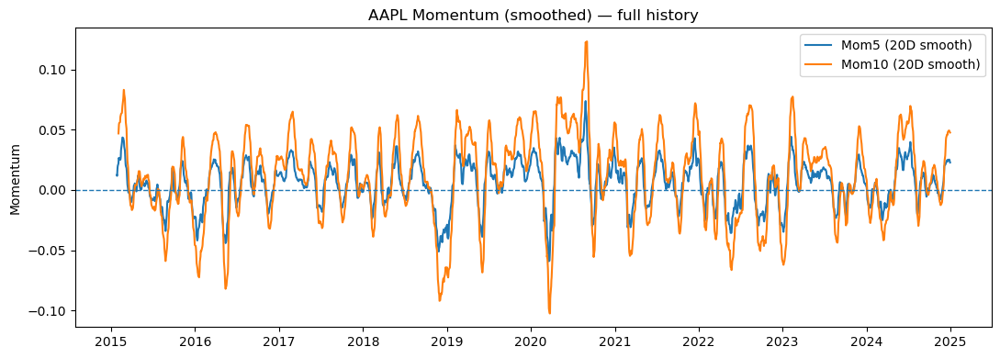

count    2509.000000
mean        0.005504
std         0.037191
min        -0.180304
25%        -0.015610
50%         0.006895
75%         0.027247
max         0.175078
Name: Mom5, dtype: float64


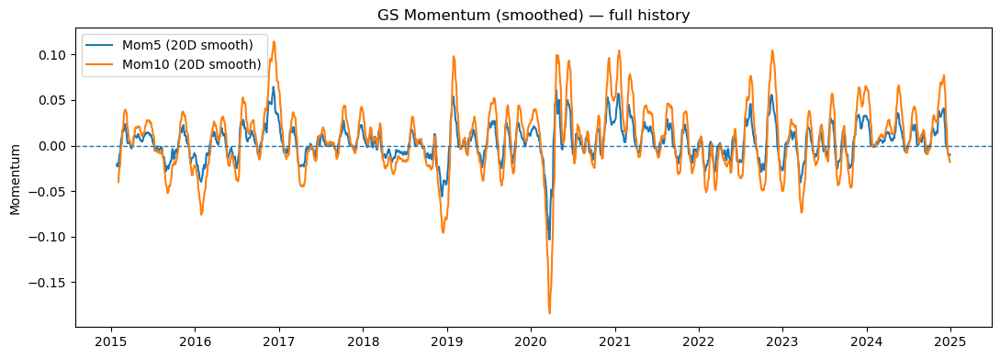

count    2509.000000
mean        0.003457
std         0.039607
min        -0.257999
25%        -0.018437
50%         0.003474
75%         0.025485
max         0.213278
Name: Mom5, dtype: float64


In [30]:
for name, df in stocks.items():
    # Smooth momentum over the entire dataset
    df['Mom5_smooth']  = df['Mom5'].rolling(20, min_periods=10).mean()
    df['Mom10_smooth'] = df['Mom10'].rolling(20, min_periods=10).mean()

    plt.figure(figsize=(11,4))
    plt.plot(df.index, df['Mom5_smooth'],  label='Mom5 (20D smooth)')
    plt.plot(df.index, df['Mom10_smooth'], label='Mom10 (20D smooth)')
    plt.axhline(0, ls='--', lw=1)
    plt.title(f"{name} Momentum (smoothed) — full history")
    plt.ylabel("Momentum")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{name}_momentum.png", dpi=300, bbox_inches='tight')
    plt.show()

    print(df['Mom5'].describe())

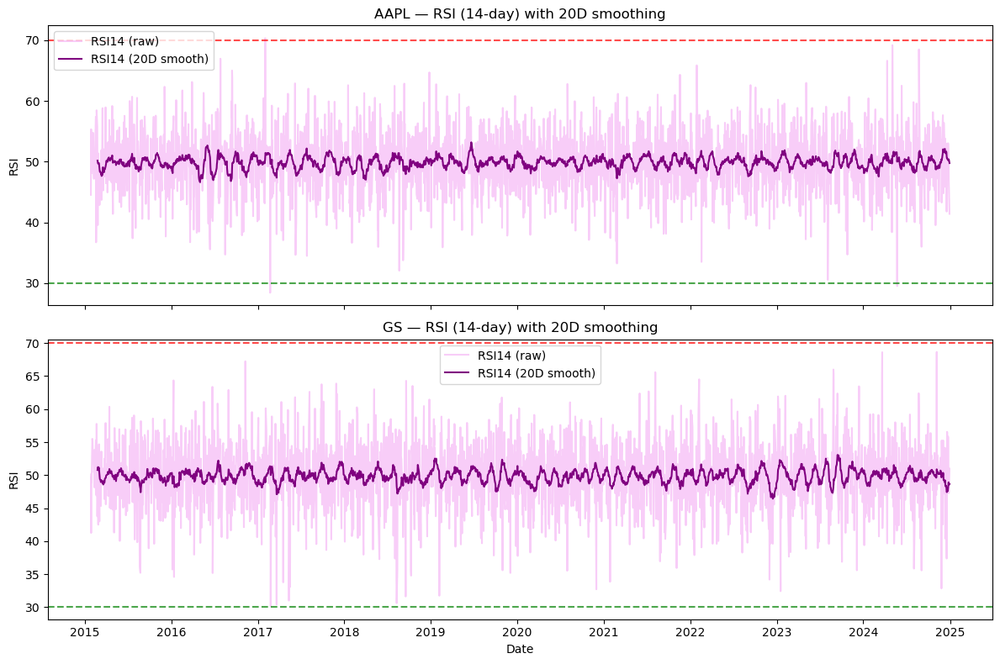

In [32]:
# Smooth RSI with rolling mean
AAPL["RSI14_smooth"] = AAPL["RSI14"].rolling(window).mean()
GS["RSI14_smooth"] = GS["RSI14"].rolling(window).mean()

# Plot
fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

for ax, (name, df) in zip(axes, [("AAPL", AAPL), ("GS", GS)]):
    ax.plot(df.index, df["RSI14"], color="violet", alpha=0.4, label="RSI14 (raw)")
    ax.plot(df.index, df["RSI14_smooth"], color="purple", label=f"RSI14 ({window}D smooth)")

    # Add overbought/oversold lines
    ax.axhline(70, color="red", linestyle="--", alpha=0.7)
    ax.axhline(30, color="green", linestyle="--", alpha=0.7)

    ax.set_title(f"{name} — RSI (14-day) with {window}D smoothing")
    ax.set_ylabel("RSI")
    ax.legend()

plt.xlabel("Date")
plt.tight_layout()
plt.show()

      Dow_Jones    NASDAQ     SP500
AAPL   0.674559  0.798757  0.748123


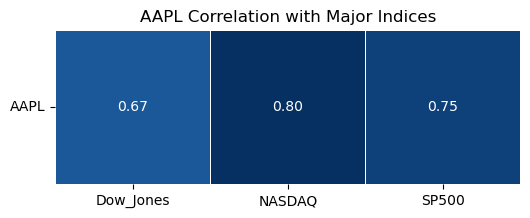

    Dow_Jones    NASDAQ     SP500
GS   0.790837  0.632767  0.734185


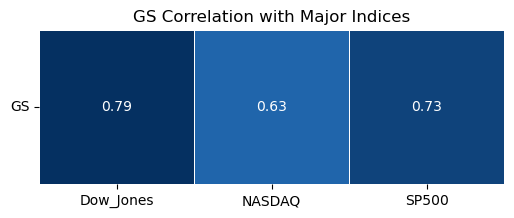

In [34]:
SP500 = preprocess_stock("data_yahoo/train/indices/SP500.csv")
NASDAQ = preprocess_stock("data_yahoo/train/indices/NASDAQ.csv")
Dow_Jones = preprocess_stock("data_yahoo/train/indices/Dow_Jones.csv")
stocks = {"AAPL": AAPL, "GS": GS} 
indices_dict = {'SP500':SP500, 'NASDAQ':NASDAQ, 'Dow_Jones':Dow_Jones}

for name, df in stocks.items():
    # Build combined DataFrame with Apple + indices Adjusted Returns
    corr_df = pd.DataFrame({name: df['Log_Adj_Return']})
    
    # Add each index from dictionary
    for ind, df in indices_dict.items():
        corr_df[ind] = df['Log_Adj_Return']
    
    # Drop missing values (first row will be NaN due to pct_change)
    corr_df = corr_df.dropna()
    # corr_df.info()
    # print(corr_df.head())
    
    # Pearson correlation
    corr_mat = corr_df.corr()
    # Extract only Apple correlations with indices
    stock_corr_df = corr_mat.loc[[name], ['Dow_Jones','NASDAQ','SP500']]
    print(stock_corr_df)
    # Create heatmap
    plt.figure(figsize=(6,2))
    sns.heatmap(
        stock_corr_df,
        annot=True, cmap="RdBu", center=0,
        linewidths=0.5, cbar=False, fmt=".2f"
    )
    
    plt.title(f"{name} Correlation with Major Indices")
    plt.yticks(rotation=0)   
    plt.savefig(f"{name}_correlation.png", bbox_inches="tight", dpi=300)
    plt.show()



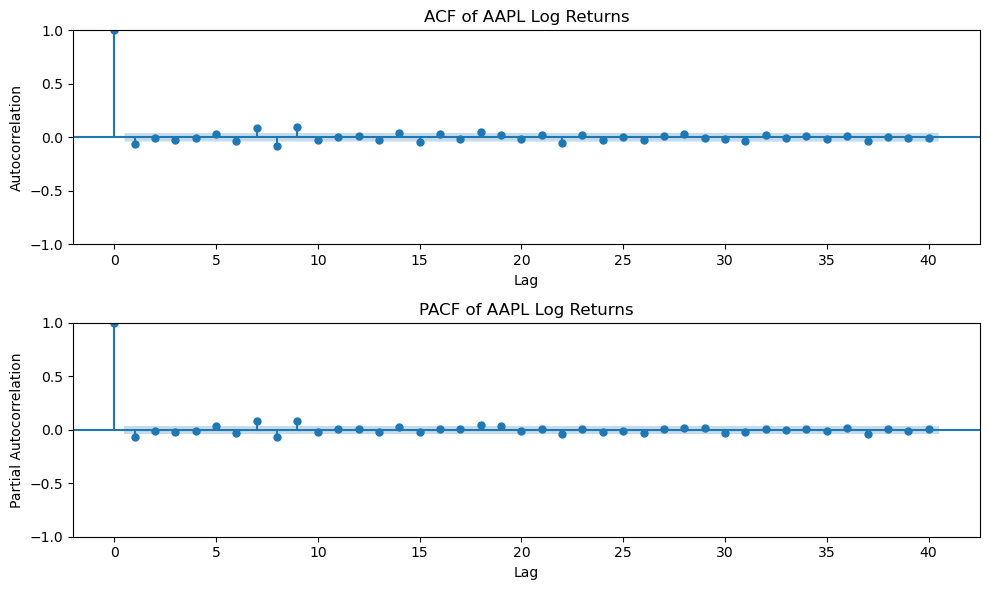

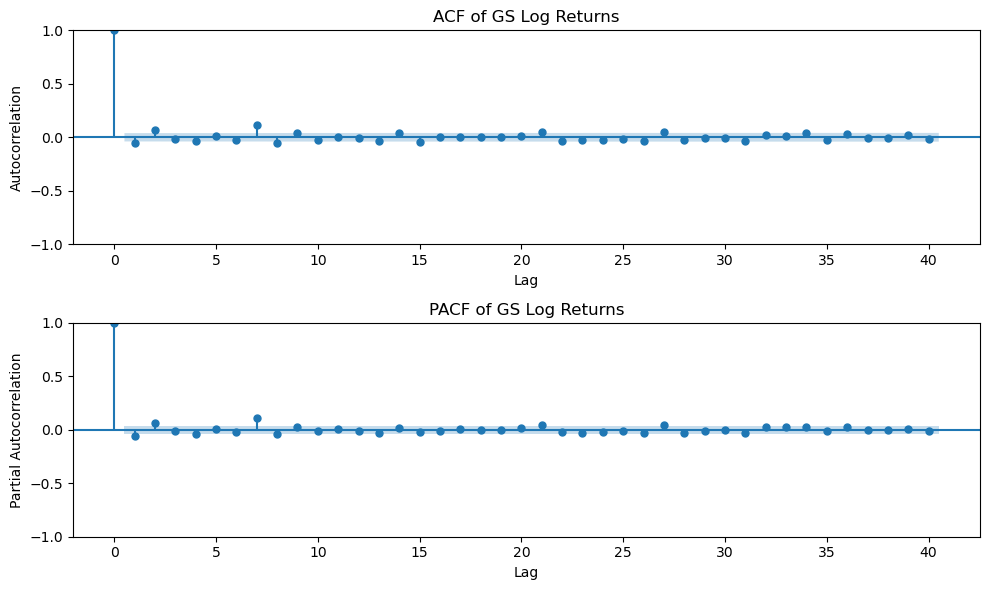

In [36]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

for name, df in stocks.items():
    series = df['Log_Adj_Return'].dropna()
    
    fig, ax = plt.subplots(2, 1, figsize=(10,6))
    
    # ACF
    plot_acf(series, lags=40, ax=ax[0], alpha=0.05)
    ax[0].set_title(f"ACF of {name} Log Returns")
    ax[0].set_xlabel("Lag")
    ax[0].set_ylabel("Autocorrelation")
    
    # PACF
    plot_pacf(series, lags=40, ax=ax[1], alpha=0.05)
    ax[1].set_title(f"PACF of {name} Log Returns")
    ax[1].set_xlabel("Lag")
    ax[1].set_ylabel("Partial Autocorrelation")
    
    plt.tight_layout()
    plt.show()

## Testing for Stationarity

In [38]:
from statsmodels.tsa.stattools import adfuller

for name, df in stocks.items():
    result = adfuller(df['Log_Adj_Return'].dropna())
    print(f"{name} ADF Statistic:", result[0])
    print(f"{name} p-value:", result[1])

AAPL ADF Statistic: -15.547684944349237
AAPL p-value: 2.1195761350552535e-28
GS ADF Statistic: -17.15239963868426
GS p-value: 6.928278053691776e-30


In [42]:
all_stocks_sort = pd.read_csv('data_yahoo/all_stocks_sort.csv')

# --- Compute per-stock summary stats ---
# Explicitly select columns after groupby to avoid the deprecation warning
summary_ynext = (
    all_stocks_sort.groupby("Ticker")["y_next"]  # Only select the "y" column after groupby
    .apply(lambda series: pd.Series({
        "Mean": series.mean(),
        "Std": series.std(),
        "Skewness": skew(series.dropna()),
        "Kurtosis": kurtosis(series.dropna()),
        "Min": series.min(),
        "Max": series.max(),
        "Obs": series.count()
    }))
    .reset_index()
)

# --- Round for readability ---
summary_ynext = summary_ynext.round(4)

# Preview
# print(summary_ynext.head())

summary_ynext.mean(numeric_only=True)
summary_ynext

,Ticker,level_1,y_next
0,AAPL,Mean,0.0009
1,AAPL,Std,0.0179
2,AAPL,Skewness,-0.2106
3,AAPL,Kurtosis,5.5435
4,AAPL,Min,-0.1377
...,...,...,...
310,XOM,Skewness,-0.1408
311,XOM,Kurtosis,6.5696
312,XOM,Min,-0.1304
313,XOM,Max,0.1194


In [44]:


# Collect summary stats for each stock
summary_stats = {}

for name, df in stocks.items():
    summary_stats[name] = df[['Mom5','Mom10','Log_Adj_Return']].describe().loc[['mean','std','min','max']]

# Combine into one DataFrame
summary_df = pd.concat(summary_stats, axis=0)
print(summary_df)

# Get overall mean across stocks
mean_across_stocks = summary_df.groupby(level=1).mean()
print("\nMean across all stocks:\n", mean_across_stocks)

# Find stock with highest/lowest mean for each metric
highest = summary_df.xs('mean', level=1).idxmax()
lowest  = summary_df.xs('mean', level=1).idxmin()

print("\nStocks with highest mean values:\n", highest)
print("\nStocks with lowest mean values:\n", lowest)

               Mom5     Mom10  Log_Adj_Return
AAPL mean  0.005504  0.010999        0.000930
     std   0.037191  0.052809        0.017934
     min  -0.180304 -0.201052       -0.137708
     max   0.175078  0.211142        0.113158
GS   mean  0.003457  0.006957        0.000509
     std   0.039607  0.056373        0.018153
     min  -0.257999 -0.348528       -0.135880
     max   0.213278  0.219292        0.161951

Mean across all stocks:
           Mom5     Mom10  Log_Adj_Return
max   0.194178  0.215217        0.137554
mean  0.004481  0.008978        0.000719
min  -0.219152 -0.274790       -0.136794
std   0.038399  0.054591        0.018044

Stocks with highest mean values:
 Mom5              AAPL
Mom10             AAPL
Log_Adj_Return    AAPL
dtype: object

Stocks with lowest mean values:
 Mom5              GS
Mom10             GS
Log_Adj_Return    GS
dtype: object


In [50]:
# --- Compute per-stock summary stats ---
# Explicitly select columns after groupby to avoid the deprecation warning
summary_y5wd = (
    all_stocks_sort.groupby("Ticker")["y_fwd5"]  # Only select the "y" column after groupby
    .apply(lambda series: pd.Series({
        "Mean": series.mean(),
        "Std": series.std(),
        "Skewness": skew(series.dropna()),
        "Kurtosis": kurtosis(series.dropna()),
        "Min": series.min(),
        "Max": series.max(),
        "Obs": series.count()
    }))
    .reset_index()
)

#  Round for readability 
summary_y5wd = summary_y5wd.round(4)

# Preview
print(summary_y5wd.head())
summary_y5wd.mean(numeric_only=True)

  Ticker   level_1  y_fwd5
0   AAPL      Mean  0.0046
1   AAPL       Std  0.0373
2   AAPL  Skewness -0.3074
3   AAPL  Kurtosis  1.6959
4   AAPL       Min -0.1927


y_fwd5    357.199689
dtype: float64

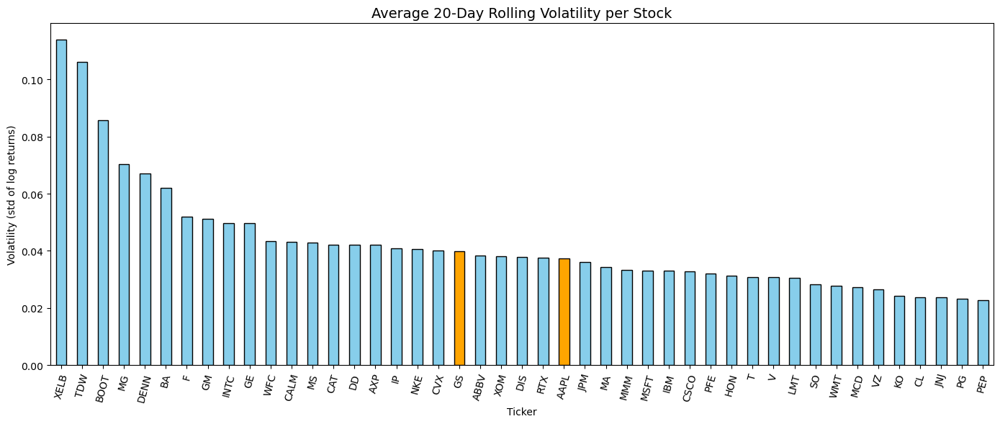

In [54]:
vol_summary = (
    all_stocks_sort
    .groupby("Ticker")["y_fwd5"]       # y = log adjusted return
    .std()                        # standard deviation per ticker
    .sort_values(ascending=False) #  rank from highest to lowest
)

highlight = ["AAPL", "GS"]

colors = ["orange" if ticker in highlight else "skyblue" for ticker in vol_summary.index]

plt.figure(figsize=(14,6))
vol_summary.plot(kind="bar", color=colors, edgecolor="black")
plt.title("Average 20-Day Rolling Volatility per Stock", fontsize=14)
plt.ylabel("Volatility (std of log returns)")
plt.xlabel("Ticker")
plt.xticks(rotation=75)
plt.tight_layout()
plt.savefig("stocks_vol20.png", bbox_inches="tight", dpi=300)
plt.show()
